In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage.measure import compare_psnr
import math

In [2]:
plt.rcParams['figure.figsize'] = [20, 20]

### 1. Display SSD and find location where SSD is minimum

In [3]:
# Load the images of our waldo template and crowd
crowd = cv2.imread("where_is_waldo.jpg", cv2.IMREAD_COLOR | cv2.IMREAD_GRAYSCALE)
template = cv2.imread("template1.png", cv2.IMREAD_COLOR | cv2.IMREAD_GRAYSCALE)

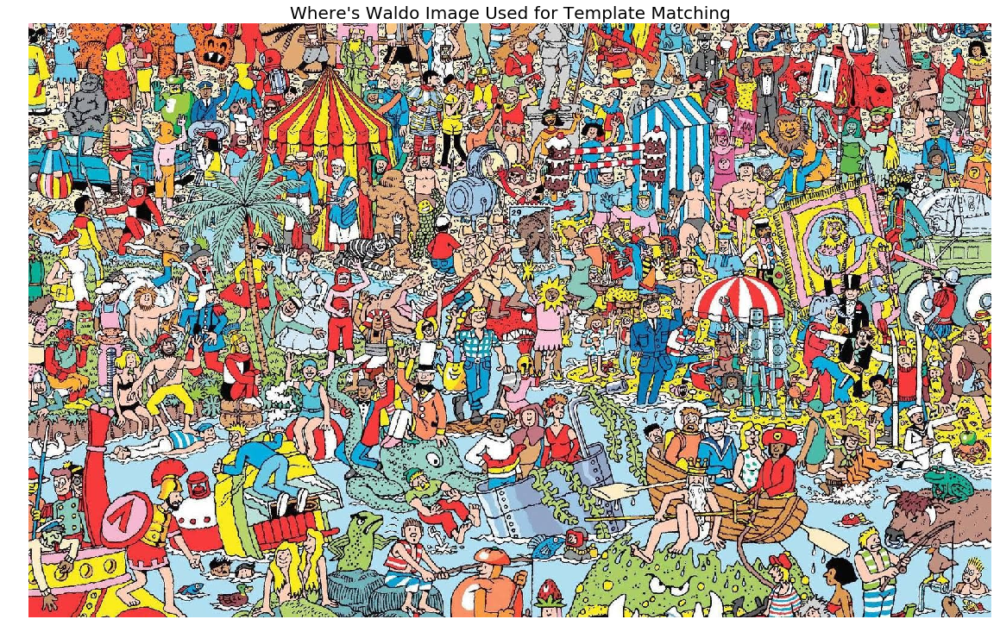

In [4]:
# Plot our image as a sanity check
plt.imshow(cv2.cvtColor(crowd, cv2.COLOR_BGR2RGB)), plt.axis("off")
plt.title("Where's Waldo Image Used for Template Matching", fontsize=20)
plt.show()

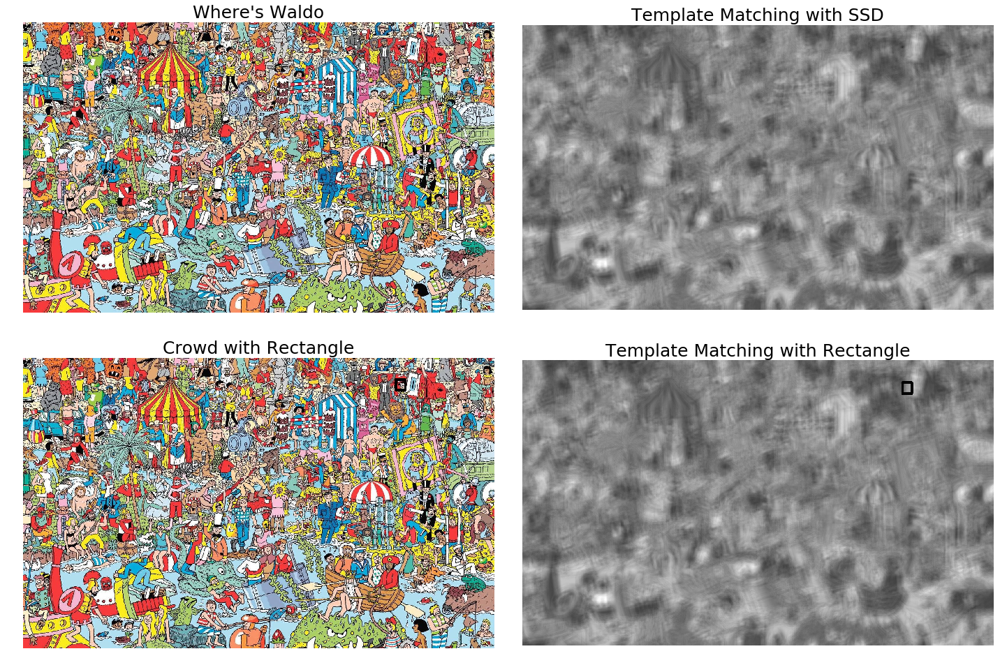

In [5]:
# This method will take the SSD for each point and return an array of values
# ideally, waldo will appear at coordinates denoted by the minimum value 
# in this array
res = cv2.matchTemplate(crowd, template, cv2.TM_SQDIFF)

# This will return to the location of the minimum and 
# maximum values in our resulting array
min_val, max_val, top_left, max_loc = cv2.minMaxLoc(res)

# We aim to place a bounding rectangle on waldo
crowd_rect = np.copy(crowd)
res_rect = np.copy(res)
h, w, d = template.shape

# We calculate the bottom right of our rectangle to be our minimum coordinates
# plus the height and width of our template
bottom_right = (top_left[0] + w, top_left[1] + h)
cv2.rectangle(crowd_rect, top_left, bottom_right, (0, 0, 0), 7)
cv2.rectangle(res_rect, top_left, bottom_right, (0, 0, 0), 7)

plt.subplot(321), plt.imshow(cv2.cvtColor(crowd, cv2.COLOR_BGR2RGB))
plt.title("Where's Waldo", fontsize=25), plt.axis("off")
plt.subplot(322), plt.imshow(res, cmap="gray")
plt.title("Template Matching with SSD", fontsize=25), plt.axis("off")
plt.subplot(323), plt.imshow(cv2.cvtColor(crowd_rect, cv2.COLOR_BGR2RGB))
plt.title("Crowd with Rectangle", fontsize=25), plt.axis("off")
plt.subplot(324), plt.imshow(res_rect, cmap="gray")
plt.title("Template Matching with Rectangle", fontsize=25), plt.axis("off")

plt.tight_layout()
plt.show()

In [6]:
# We print the coordinates we find to match it later to our noisy template
print("SSD is minimum at x: {}, y: {}".format(top_left[0], top_left[1]))

SSD is minimum at x: 1258, y: 74


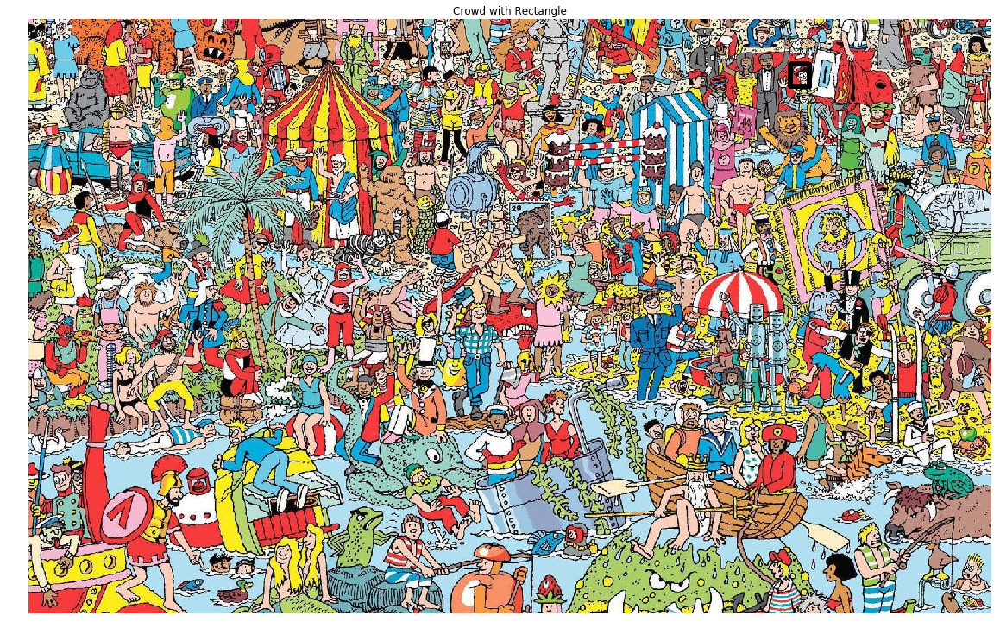

In [7]:
plt.imshow(cv2.cvtColor(crowd_rect, cv2.COLOR_BGR2RGB))
plt.title("Crowd with Rectangle"), plt.axis("off")
plt.show()

Now we try the same thing with a noisy template:

### 2. Display SSD and find location where SSD is minimum for noisy template

In [8]:
crowd = cv2.imread("where_is_waldo.jpg", cv2.IMREAD_COLOR | cv2.IMREAD_GRAYSCALE)
template_noisy = cv2.imread("template2.png", cv2.IMREAD_COLOR | cv2.IMREAD_GRAYSCALE)

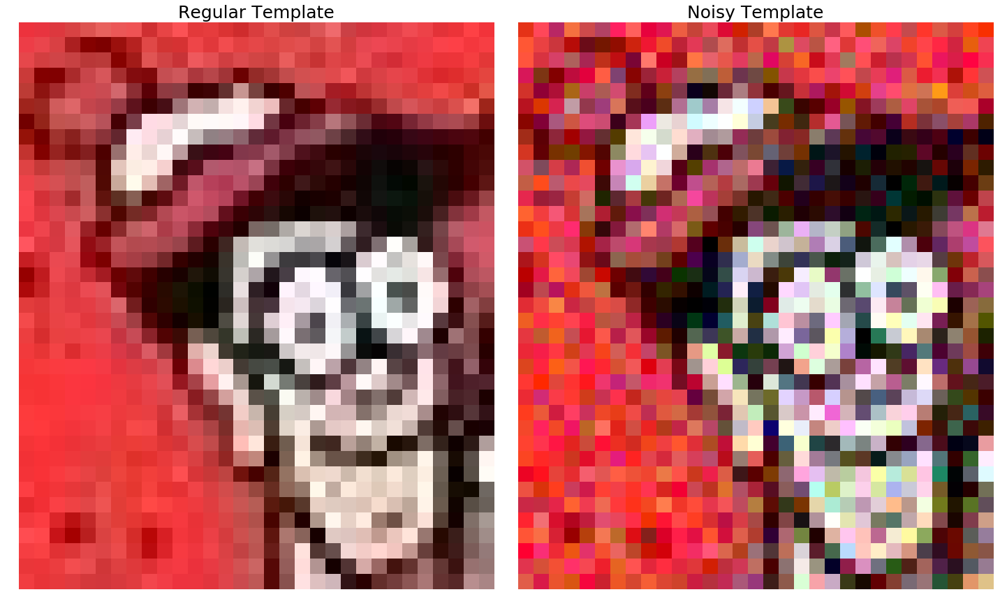

In [9]:
plt.subplot(121), plt.imshow(cv2.cvtColor(template, cv2.COLOR_BGR2RGB))
plt.title("Regular Template", fontsize=25), plt.axis("off")
plt.subplot(122), plt.imshow(cv2.cvtColor(template_noisy, cv2.COLOR_BGR2RGB))
plt.title("Noisy Template", fontsize=25), plt.axis("off")

plt.tight_layout()
plt.show()

In [10]:
compare_psnr(template, template_noisy)

20.544882932098332

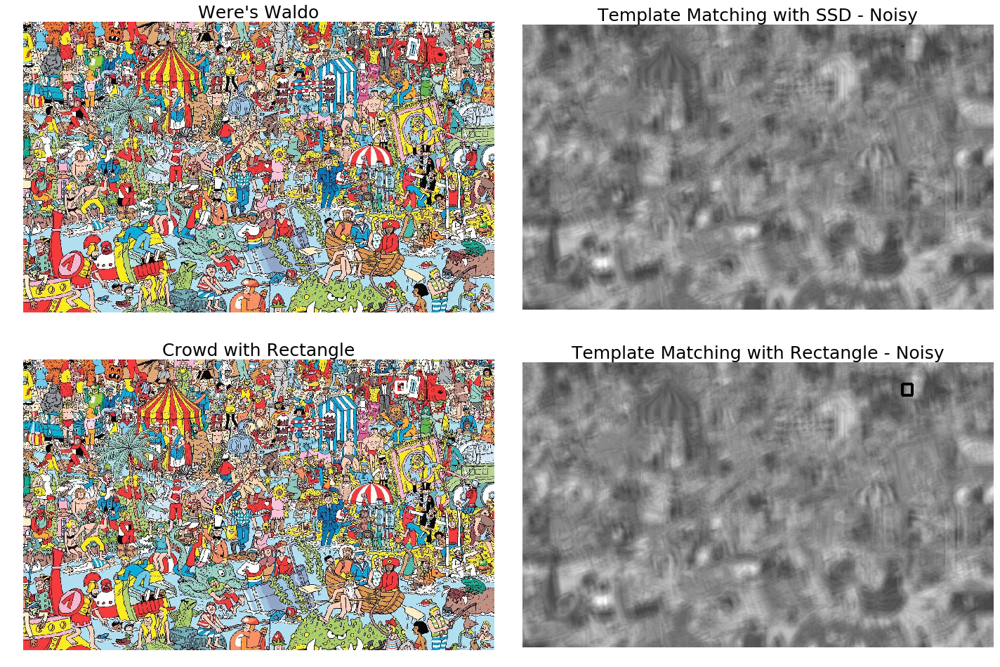

In [11]:
# This method will take the SSD for each point and return an array of values
# ideally, waldo will appear at coordinates denoted by the minimum value 
# in this array
res = cv2.matchTemplate(crowd, template_noisy, cv2.TM_SQDIFF)

# This will return to the location of the minimum and 
# maximum values in our resulting array
min_val, max_val, top_left, max_loc = cv2.minMaxLoc(res)

# We aim to place a bounding rectangle on waldo
crowd_rect = np.copy(crowd)
res_rect = np.copy(res)
h, w, d = template.shape

# We calculate the bottom right of our rectangle to be our minimum coordinates
# plus the height and width of our template
bottom_right = (top_left[0] + w, top_left[1] + h)
cv2.rectangle(crowd_rect, top_left, bottom_right, (255, 255, 255), 7)
cv2.rectangle(res_rect, top_left, bottom_right, (255, 255, 255), 7)

plt.subplot(321), plt.imshow(cv2.cvtColor(crowd, cv2.COLOR_BGR2RGB))
plt.title("Were's Waldo", fontsize=25), plt.axis("off")
plt.subplot(322), plt.imshow(res, cmap="gray")
plt.title("Template Matching with SSD - Noisy", fontsize=25), plt.axis("off")
plt.subplot(323), plt.imshow(cv2.cvtColor(crowd_rect, cv2.COLOR_BGR2RGB))
plt.title("Crowd with Rectangle", fontsize=25), plt.axis("off")
plt.subplot(324), plt.imshow(res_rect, cmap="gray")
plt.title("Template Matching with Rectangle - Noisy", fontsize=25), plt.axis("off")

plt.tight_layout()
plt.show()

In [12]:
print("SSD is minimum at x: {}, y: {}".format(top_left[0], top_left[1]))

SSD is minimum at x: 1258, y: 74


We are still able to recognize Waldo even with a noisy template, this can be seen by the fact that we identify the same minimum for our noisy and regular template match